In [1]:
%load_ext autoreload
%autoreload 2

In [8]:
import torch
from transformers import T5Tokenizer, T5EncoderModel
import os
from os.path import join
import torch
import torch as th
import seaborn as sns
import matplotlib.pyplot as plt
import pickle as pkl
import pandas as pd
import cv2
import pandas as pd
import numpy as np
from tqdm.auto import trange
from contextlib import redirect_stdout
import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionObjectRelation/PixArt-alpha")
from diffusion.model.builder import build_model
from diffusion.utils.misc import set_random_seed, read_config, init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/home12/binxuwang/Github/DiffusionObjectRelation")
from utils.pixart_sampling_utils import pipeline_inference_custom, \
    PixArtAlphaPipeline_custom
from utils.pixart_utils import state_dict_convert
from utils.pixart_utils import construct_diffuser_pipeline_from_config
from utils.cv2_eval_utils import find_classify_objects, evaluate_parametric_relation, eval_func_factory, scene_info_collection
from utils.cv2_eval_utils import evaluate_pipeline_on_prompts, print_evaluation_summary
from utils.relation_shape_dataset_lib import ShapesDataset

In [9]:
from matplotlib.ticker import MultipleLocator
from circuit_toolkit.plot_utils import saveallforms

In [10]:
generalize_figdir = f"/n/home12/binxuwang/Github/DiffusionObjectRelation/Figures/prompt_generalization_figures"
spbiasfigdir = "/n/home12/binxuwang/Github/DiffusionObjectRelation/Figures/prompt_generalization_spatial_bias"

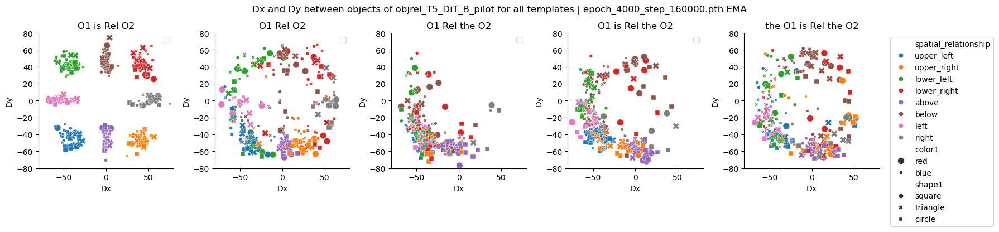

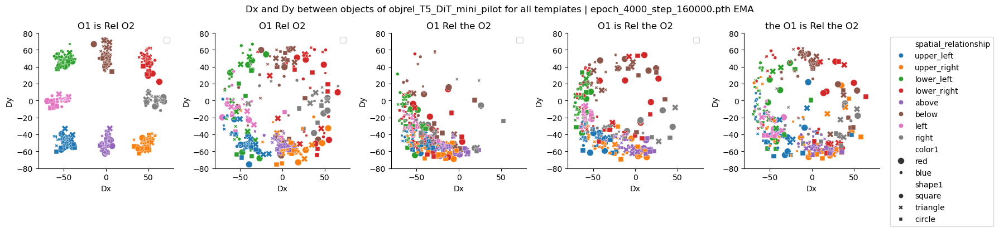

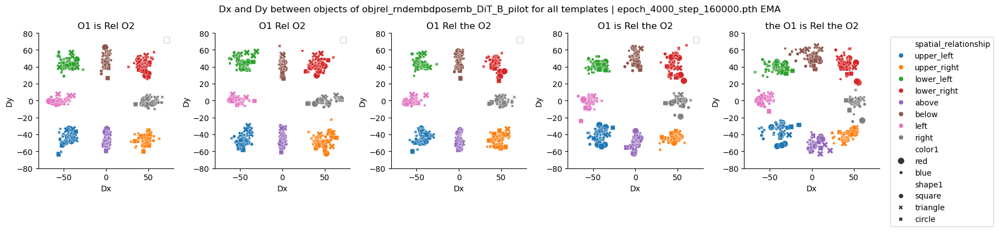

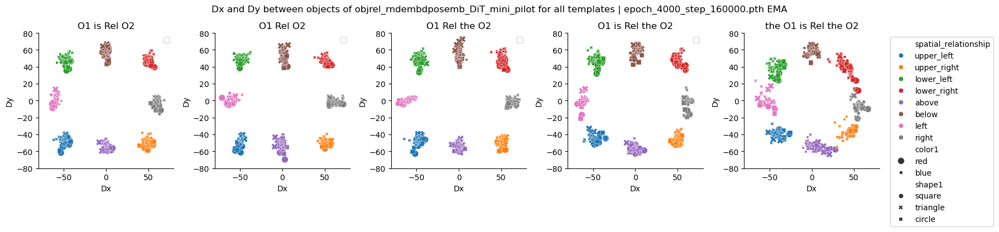

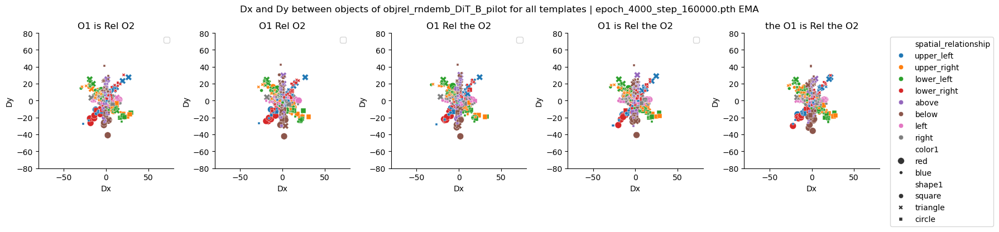

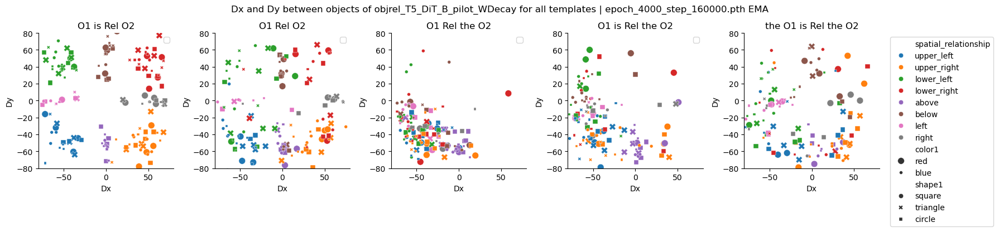

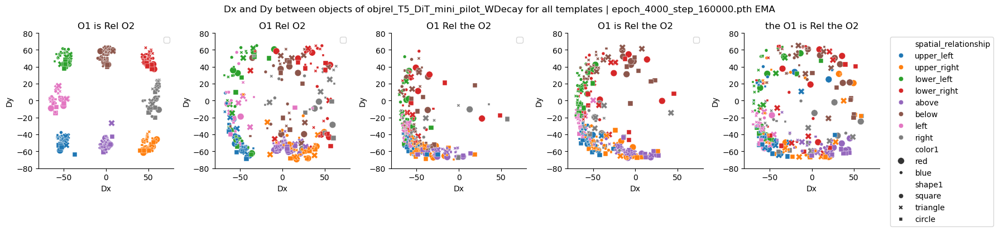

In [11]:
model_run_name = "objrel_T5_DiT_B_pilot"
for model_run_name in ["objrel_T5_DiT_B_pilot", 
                       "objrel_T5_DiT_mini_pilot", 
                       "objrel_rndembdposemb_DiT_B_pilot",
                       "objrel_rndembdposemb_DiT_mini_pilot",
                       "objrel_rndemb_DiT_B_pilot",
                       "objrel_T5_DiT_B_pilot_WDecay",
                       "objrel_T5_DiT_mini_pilot_WDecay",
                       ]:
    ckpt_name = "epoch_4000_step_160000.pth"
    savedir = f"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/{model_run_name}"
    evaldir = join(savedir, "generalization_eval")
    eval_df_all_temp = pd.read_csv(join(join(evaldir, f"eval_df_{ckpt_name}_ema_all_templates.csv")))
    
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    for i, template_name in enumerate(['color1_shape1_is_rel_text_color2_shape2',
        'color1_shape1_rel_text_color2_shape2',
        'color1_shape1_rel_text_the_color2_shape2',
        'color1_shape1_is_rel_text_the_color2_shape2',
        'the_color1_shape1_is_rel_text_the_color2_shape2']):
        DxDy_per_prompt = eval_df_all_temp.groupby(["template", "prompt_id"]).\
            agg({"Dx": "mean", "Dy": "mean"}).xs(template_name, level="template")

        prompts_list, scene_info_list = pkl.load(open(join(evaldir, f"prompt_collections_{template_name}.pkl"), "rb"))
        scene_info_df = pd.DataFrame(scene_info_list)
        DxDy_prompt_info_df = scene_info_df.merge(DxDy_per_prompt, right_index=True, left_index=True)
        plt.sca(axes[i])
        sns.scatterplot(x="Dx", y="Dy", data=DxDy_prompt_info_df, 
                        hue="spatial_relationship", size="color1", style="shape1")
        plt.xlim(-80, 80)
        plt.ylim(-80, 80)
        plt.gca().set_aspect('equal', adjustable='box')
        if i == 4:
            plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
        else:
            plt.legend("")
        plt.title(template_name.replace("color1_shape1","O1").\
            replace("color2_shape2","O2").replace("rel_text","Rel").\
                replace("_"," "))
    plt.suptitle(f"Dx and Dy between objects of {model_run_name} for all templates | {ckpt_name} EMA")
    plt.tight_layout()
    saveallforms([spbiasfigdir, generalize_figdir], f"{model_run_name}_final_ema_DxDy_per_prompt_templates")
    plt.show()

### Test that the location of word `the` change the representation and sampling results

In [12]:
model_run_name = "objrel_T5_DiT_B_pilot" # "objrel_rndembdposemb_DiT_B_pilot" 
# model_run_name = "objrel_T5_DiT_mini_pilot_WDecay" # "objrel_rndembdposemb_DiT_B_pilot" 
# ckpt_name = "epoch_4000_step_160000.pth" # "epoch_4000_step_160000.pth" 
ckpt_name = "epoch_4000_step_160000.pth"  # "epoch_4000_step_160000.pth" 
text_encoder_type = "T5" 
savedir = f"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/{model_run_name}"
config = read_config(join(savedir, 'config.py'))
# Build pipeline from config
pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)
text_feat_dir_old = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/training_datasets/random_emd_dictionary'
T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"
tokenizer = T5Tokenizer.from_pretrained(T5_path, )#subfolder="tokenizer")
if text_encoder_type == "T5":
    text_encoder = T5EncoderModel.from_pretrained(T5_path, load_in_8bit=False, torch_dtype=torch.bfloat16, )
    
ckptdir = join(savedir, "checkpoints")

ckpt = torch.load(join(ckptdir, ckpt_name))
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))
# pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict']))
pipeline.tokenizer = tokenizer
pipeline.to(device="cuda", dtype=torch.float16);
pipeline.text_encoder = text_encoder.to(device="cuda", )

weight_dtype: torch.float16


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Expected types for transformer: (<class 'diffusers.models.transformers.pixart_transformer_2d.PixArtTransformer2DModel'>,), got <class 'diffusers.models.transformers.transformer_2d.Transformer2DModel'>.
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/tmp/ipykernel_131493/1359738890.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(join(ckptdir, ckpt_name))


In [13]:
from itertools import product
def generate_prompt_collection(spatial_phrases, 
                               prompt_template="{color1} {shape1} is {rel_text} {color2} {shape2}",
                               color1="blue", shape1="circle", color2="red", shape2="square"):
    prompt_collection = []
    scene_info_collection = []
    for spatial_relationship, rel_text_collection in spatial_phrases.items():
        if spatial_relationship in ["in_front", "behind"]:
            continue
        for rel_text in rel_text_collection:
            prompt = prompt_template.format(color1=color1, shape1=shape1, rel_text=rel_text, color2=color2, shape2=shape2)
            scene_info = {
                "color1": color1,
                "shape1": shape1,
                "color2": color2,
                "shape2": shape2,
                "spatial_relationship": spatial_relationship
            }
            prompt_collection.append(prompt)
            scene_info_collection.append(scene_info)
    return prompt_collection, scene_info_collection


def generate_all_prompt_collection(spatial_phrases, 
                               prompt_template="{color1} {shape1} is {rel_text} {color2} {shape2}",):
    color_list = ['red', 'blue']
    shape_list = ['square', 'triangle', 'circle']
    prompt_collection = []
    scene_info_collection = []
    for color1, color2 in product(color_list, color_list):
        if color1 == color2:      # skip same‐color pairs
            continue
        for shape1, shape2 in product(shape_list, shape_list):
            if shape1 == shape2:
                continue
            for spatial_relationship, rel_text_collection in spatial_phrases.items():
                if spatial_relationship in ["in_front", "behind"]:
                    continue
                for rel_text in rel_text_collection:
                    prompt = prompt_template.format(color1=color1, shape1=shape1, rel_text=rel_text, color2=color2, shape2=shape2)
                    scene_info = {
                        "color1": color1,
                        "shape1": shape1,
                        "color2": color2,
                        "shape2": shape2,
                        "spatial_relationship": spatial_relationship
                    }
                    prompt_collection.append(prompt)
                    scene_info_collection.append(scene_info)
    return prompt_collection, scene_info_collection

In [14]:
dataset_tmp = ShapesDataset(num_images=10000)

In [15]:
ckpt_name = "epoch_4000_step_160000.pth"  # "epoch_4000_step_160000.pth" 
ckpt = torch.load(join(ckptdir, ckpt_name))
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))

/tmp/ipykernel_131493/4239965162.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(join(ckptdir, ckpt_name))


<All keys matched successfully>

### The perturbation

In [36]:
prompt_template = "{color1} {shape1} is {rel_text} the {color2} {shape2}"
template_name = prompt_template.replace("{", "").replace("}", "").replace(" ", "_")
prompt_collection, scene_info_collection = generate_prompt_collection(dataset_tmp.spatial_phrases,
                                prompt_template=prompt_template,
                                color1="blue", shape1="circle", color2="red", shape2="square")

pipeline.set_progress_bar_config(disable=True)
eval_df_syn, object_df_syn = evaluate_pipeline_on_prompts(pipeline, prompt_collection, scene_info_collection,
                                                          num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                          max_sequence_length=20, generator_seed=42, prompt_dtype=torch.float16,
                                                          color_margin=25, spatial_threshold=5, device="cuda")

print_evaluation_summary(eval_df_syn, group_by_prompt=False)

Evaluating prompts:   0%|          | 0/22 [00:00<?, ?it/s]

=== EVALUATION SUMMARY ===
Total samples evaluated: 1078
Number of prompts: 22

--- Overall Performance ---
overall                  : 0.288
overall_loose            : 0.433
shape                    : 0.983
color                    : 0.985
exist_binding            : 0.981
unique_binding           : 0.977
spatial_relationship     : 0.288
spatial_relationship_loose: 0.433
Dx                       : -42.287
Dy                       : -27.998
x1                       : 48.478
y1                       : 37.388
x2                       : 90.764
y2                       : 65.387


In [37]:
prompt_scene_info_df = pd.DataFrame(scene_info_collection)
eval_scene_info_df_syn = eval_df_syn.merge(prompt_scene_info_df, left_on="prompt_id", right_index=True, suffixes=("", "_prompt"))

In [38]:
import plotly.express as px

# Create interactive scatter plot with hover information
fig = px.scatter(
    eval_scene_info_df_syn, 
    x="Dx", 
    y="Dy", 
    color="spatial_relationship_prompt",
    symbol="prompt_id",
    hover_data={
        "prompt_id": True,
        "prompt": True,
        "Dx": ":.2f",
        "Dy": ":.2f"
    },
    title=f"Spatial Relationship Evaluation Results | {prompt_template}",
    width=1100,
    height=800
)

fig.update_layout(
    xaxis=dict(range=[-80, 80]),
    yaxis=dict(range=[-80, 80], scaleanchor="x", scaleratio=1),
    legend=dict(x=1.05, y=1, xanchor="left", yanchor="top")
)

fig.show()

### Opposite the perturbation

In [39]:
prompt_template = "the {color1} {shape1} is {rel_text} {color2} {shape2}"
template_name = prompt_template.replace("{", "").replace("}", "").replace(" ", "_")
prompt_collection, scene_info_collection = generate_prompt_collection(dataset_tmp.spatial_phrases,
                                prompt_template=prompt_template,
                                color1="blue", shape1="circle", color2="red", shape2="square")

pipeline.set_progress_bar_config(disable=True)
eval_df_syn, object_df_syn = evaluate_pipeline_on_prompts(pipeline, prompt_collection, scene_info_collection,
                                                          num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                          max_sequence_length=20, generator_seed=42, prompt_dtype=torch.float16,
                                                          color_margin=25, spatial_threshold=5, device="cuda")

print_evaluation_summary(eval_df_syn, group_by_prompt=False)

Evaluating prompts:   0%|          | 0/22 [00:00<?, ?it/s]

=== EVALUATION SUMMARY ===
Total samples evaluated: 1078
Number of prompts: 22

--- Overall Performance ---
overall                  : 0.341
overall_loose            : 0.501
shape                    : 0.965
color                    : 0.977
exist_binding            : 0.961
unique_binding           : 0.956
spatial_relationship     : 0.341
spatial_relationship_loose: 0.501
Dx                       : -30.436
Dy                       : 23.912
x1                       : 56.849
y1                       : 69.139
x2                       : 87.285
y2                       : 45.227


In [40]:
prompt_scene_info_df = pd.DataFrame(scene_info_collection)
eval_scene_info_df_syn = eval_df_syn.merge(prompt_scene_info_df, left_on="prompt_id", right_index=True, suffixes=("", "_prompt"))

In [43]:
import plotly.express as px

# Create interactive scatter plot with hover information
fig = px.scatter(
    eval_scene_info_df_syn, 
    x="Dx", 
    y="Dy", 
    color="spatial_relationship_prompt",
    symbol="prompt_id",
    hover_data={
        "prompt_id": True,
        "prompt": True,
        "Dx": ":.2f",
        "Dy": ":.2f"
    },
    title=f"Spatial Relationship Evaluation Results | {prompt_template}",
    width=1100,
    height=800
)

fig.update_layout(
    xaxis=dict(range=[-80, 80]),
    yaxis=dict(range=[-80, 80], scaleanchor="x", scaleratio=1),
    legend=dict(x=1.05, y=1, xanchor="left", yanchor="top")
)

fig.show()

#### Scratch

In [ ]:
eval_df_syn.groupby(["prompt_id"]).agg({"Dx": "mean", "Dy": "mean"})

,Dx,Dy
prompt_id,,
0,-37.428571,-51.326531
1,-45.489796,40.204082
2,-54.346939,35.816327
3,-7.166667,-50.875000
4,-43.816327,47.571429
5,-49.770833,39.875000
6,-41.020408,-38.918367
7,-39.244898,48.918367
8,-51.416667,38.000000


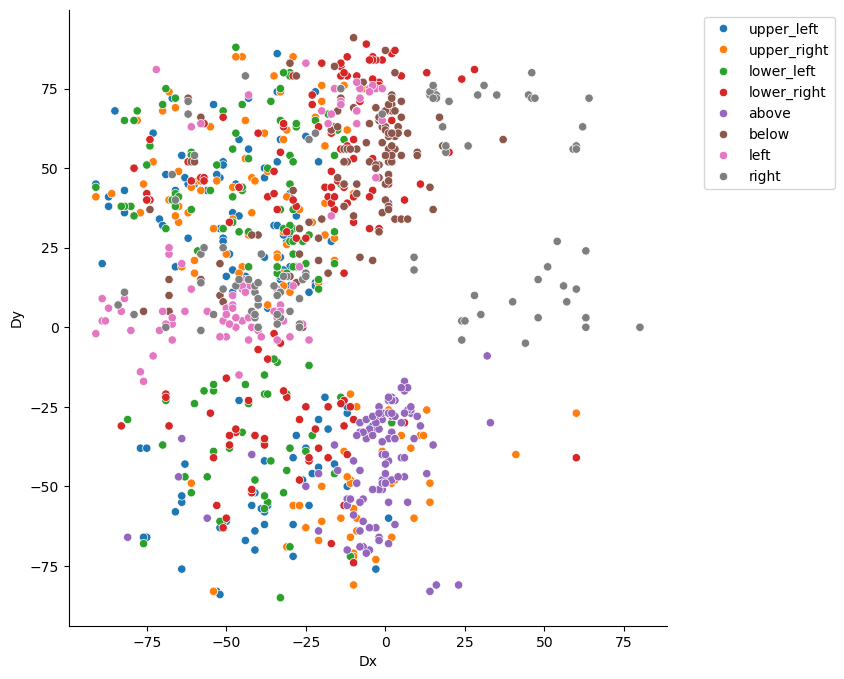

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x="Dx", y="Dy", data=eval_scene_info_df_syn, hue="spatial_relationship_prompt",)
plt.xlim(-80, 80)
plt.ylim(-80, 80)
plt.axis("image")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

### Reference plot

In [29]:
prompt_template = "{color1} {shape1} is {rel_text} {color2} {shape2}"
template_name = prompt_template.replace("{", "").replace("}", "").replace(" ", "_")
prompt_collection, scene_info_collection = generate_prompt_collection(dataset_tmp.spatial_phrases,
                                prompt_template=prompt_template,
                                color1="blue", shape1="circle", color2="red", shape2="square")

pipeline.set_progress_bar_config(disable=True)
eval_df_syn, object_df_syn = evaluate_pipeline_on_prompts(pipeline, prompt_collection, scene_info_collection,
                                                          num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                          max_sequence_length=20, generator_seed=42, prompt_dtype=torch.float16,
                                                          color_margin=25, spatial_threshold=5, device="cuda")

print_evaluation_summary(eval_df_syn, group_by_prompt=False)

Evaluating prompts:   0%|          | 0/22 [00:00<?, ?it/s]

=== EVALUATION SUMMARY ===
Total samples evaluated: 1078
Number of prompts: 22

--- Overall Performance ---
overall                  : 0.894
overall_loose            : 0.926
shape                    : 0.951
color                    : 0.948
exist_binding            : 0.931
unique_binding           : 0.930
spatial_relationship     : 0.894
spatial_relationship_loose: 0.926
Dx                       : -2.693
Dy                       : 0.900
x1                       : 63.305
y1                       : 61.045
x2                       : 65.998
y2                       : 60.145


In [30]:
prompt_scene_info_df = pd.DataFrame(scene_info_collection)
eval_scene_info_df_syn = eval_df_syn.merge(prompt_scene_info_df, left_on="prompt_id", right_index=True, suffixes=("", "_prompt"))

In [35]:
import plotly.express as px

# Create interactive scatter plot with hover information
fig = px.scatter(
    eval_scene_info_df_syn, 
    x="Dx", 
    y="Dy", 
    color="spatial_relationship_prompt",
    symbol="prompt_id",
    hover_data={
        "prompt_id": True,
        "prompt": True,
        "Dx": ":.2f",
        "Dy": ":.2f"
    },
    title=f"Spatial Relationship Evaluation Results | {prompt_template}",
    width=1100,
    height=800
)

fig.update_layout(
    xaxis=dict(range=[-80, 80]),
    yaxis=dict(range=[-80, 80], scaleanchor="x", scaleratio=1),
    legend=dict(x=1.05, y=1, xanchor="left", yanchor="top")
)

fig.show()

### Prompt with token mask

In [44]:
from experimental_scripts.generalization_profile_eval_cli import evaluate_pipeline_on_prompts_with_cached_embeddings, precompute_embeddings

In [45]:
prompt_collection

['the blue circle is to the upper left of red square',
 'the blue circle is above and to the left of red square',
 'the blue circle is diagonally up and left from red square',
 'the blue circle is to the upper right of red square',
 'the blue circle is above and to the right of red square',
 'the blue circle is diagonally up and right from red square',
 'the blue circle is to the lower left of red square',
 'the blue circle is below and to the left of red square',
 'the blue circle is diagonally down and left from red square',
 'the blue circle is to the lower right of red square',
 'the blue circle is below and to the right of red square',
 'the blue circle is diagonally down and right from red square',
 'the blue circle is above red square',
 'the blue circle is directly above red square',
 'the blue circle is higher than red square',
 'the blue circle is below red square',
 'the blue circle is directly below red square',
 'the blue circle is lower than red square',
 'the blue circle

In [61]:
scene_info_collection[:1]

[{'color1': 'blue',
  'shape1': 'circle',
  'color2': 'red',
  'shape2': 'square',
  'spatial_relationship': 'upper_left'}]

In [62]:
prompt_collection, scene_info_collection = generate_prompt_collection(dataset_tmp.spatial_phrases,
                                prompt_template="the {color1} {shape1} is {rel_text} {color2} {shape2}",
                                color1="blue", shape1="circle", color2="red", shape2="square")

### Masking results

In [71]:
prompt = "the blue circle is to the upper left of red square"
scene_info = {'color1': 'blue',
  'shape1': 'circle',
  'color2': 'red',
  'shape2': 'square',
  'spatial_relationship': 'upper_left'}
embedding_cache = precompute_embeddings({"base":([prompt], [scene_info])}, 
                                        pipeline.tokenizer, pipeline.text_encoder, 
                                        max_sequence_length=20, device="cuda")

Pre-computing text embeddings for all prompts...
Computing unconditional embedding...


Computing embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Cached embeddings for 2 unique prompts (including uncond)


In [72]:
from copy import deepcopy

In [88]:
eval_df.select_dtypes(include=['number', 'bool']).drop(columns=['prompt_id', 'sample_id'], errors='ignore').mean().round(3).to_frame().T

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


In [113]:
def print_evaluation_summary_concise(eval_df, group_by_prompt=True, show=True):
    print_df = eval_df.select_dtypes(include=['number', 'bool']).drop(columns=['prompt_id', 'sample_id'], errors='ignore').mean().round(3).to_frame().T
    if show:
        display(print_df)
    return print_df

In [ ]:
print(prompt)
print("without attention masking ", embedding_cache[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache,
                                                       num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                       generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                       device="cuda", weight_dtype=torch.float16)
print_evaluation_summary_concise(eval_df, group_by_prompt=False)

embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
for i in range(len(embmask_tmp[0])):
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    embmask_tmp[0,i] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    print_evaluation_summary_concise(eval_df, group_by_prompt=False)

the blue circle is to the upper left of red square
without attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.245,0.245,1.0,1.0,1.0,1.0,0.245,0.245,-43.98,2.735,41.367,58.551,85.347,55.816


with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.102,0.102,1.0,1.0,1.0,1.0,0.102,0.102,-45.653,13.633,38.571,65.041,84.224,51.408


with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.347,0.347,0.796,1.0,0.796,0.796,0.347,0.347,-46.692,-8.41,39.41,49.897,86.103,58.308


with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.143,0.143,0.98,1.0,0.98,0.959,0.143,0.143,-43.0,5.894,40.83,58.191,83.83,52.298


with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.51,6.653,40.0,60.204,83.51,53.551


with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.286,0.286,0.98,1.0,0.98,0.98,0.286,0.286,-42.375,1.062,41.688,57.396,84.062,56.333


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,0.98,1.0,0.98,0.959,0.163,0.163,-42.426,4.83,42.532,57.085,84.957,52.255


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.184,0.184,1.0,1.0,1.0,1.0,0.184,0.184,-43.592,5.694,40.592,59.061,84.184,53.367


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.592,39.959,60.184,83.449,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.082,0.082,0.98,1.0,0.98,0.98,0.082,0.082,-44.958,9.312,39.167,62.25,84.125,52.938


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.224,0.224,0.327,0.959,0.327,0.327,0.224,0.224,-63.5,-15.938,37.812,65.5,101.312,81.438


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.0,0.0,0.122,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.163,0.163,1.0,1.0,1.0,1.0,0.163,0.163,-43.49,6.469,39.98,60.061,83.469,53.592


### Masking original sentence

In [93]:
from copy import deepcopy

In [94]:
prompt = "blue circle is to the upper left of red square"
scene_info = {'color1': 'blue',
  'shape1': 'circle',
  'color2': 'red',
  'shape2': 'square',
  'spatial_relationship': 'upper_left'}
embedding_cache = precompute_embeddings({"base":([prompt], [scene_info])}, 
                                        pipeline.tokenizer, pipeline.text_encoder, 
                                        max_sequence_length=20, device="cuda")

Pre-computing text embeddings for all prompts...
Computing unconditional embedding...


Computing embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Cached embeddings for 2 unique prompts (including uncond)


In [108]:
print(prompt)
token_ids = pipeline.tokenizer.encode(prompt, add_special_tokens=True)
token_list = pipeline.tokenizer.convert_ids_to_tokens(token_ids)

summary_eval_df_list = []
print("without attention masking ", embedding_cache[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache,
                                                       num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                       generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                       device="cuda", weight_dtype=torch.float16)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
summary_eval_df["mask_idx"] = -1
summary_eval_df["masked_token"] = ""
summary_eval_df_list.append(summary_eval_df)

embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
for i in range(len(embmask_tmp[0])):
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    if embmask_tmp[0,i] == 0:
        continue
    embmask_tmp[0,i] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
    summary_eval_df["mask_idx"] = i
    summary_eval_df["masked_token"] = token_list[i]
    summary_eval_df_list.append(summary_eval_df)

summary_eval_df = pd.concat(summary_eval_df_list)

blue circle is to the upper left of red square
without attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.959,1.0,0.959,0.959,0.959,0.959,-50.043,-44.638,44.574,38.936,94.617,83.574


with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,-48.521,-44.146,46.292,39.625,94.812,83.771


with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.816,0.816,0.959,1.0,0.959,0.959,0.816,0.816,-56.085,-32.553,36.851,39.894,92.936,72.447


with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,-49.292,-44.208,44.729,39.792,94.021,84.0


with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,-49.312,-44.188,44.708,39.812,94.021,84.0


with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-50.122,-46.0,47.02,38.082,97.143,84.082


with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.959,1.0,0.959,0.959,0.959,0.959,-50.83,-43.723,44.085,40.17,94.915,83.894


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.959,1.0,0.959,0.959,0.959,0.959,-50.745,-43.894,43.766,39.745,94.511,83.638


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,-49.333,-44.167,44.708,39.812,94.042,83.979


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.959,1.0,0.959,0.959,0.959,0.959,-50.021,-44.723,44.617,38.851,94.638,83.574


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.449,0.449,0.469,0.939,0.469,0.449,0.449,0.449,-52.864,-47.455,48.045,40.364,100.909,87.818


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.0,0.0,0.082,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [112]:
summary_eval_df.set_index(['mask_idx', 'masked_token'])

,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
mask_idx,masked_token,,,,,,,,,,,,,,
-1,,0.959,0.959,0.959,1.000,0.959,0.959,0.959,0.959,-50.043,-44.638,44.574,38.936,94.617,83.574
0,▁blue,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,-48.521,-44.146,46.292,39.625,94.812,83.771
1,▁circle,0.816,0.816,0.959,1.000,0.959,0.959,0.816,0.816,-56.085,-32.553,36.851,39.894,92.936,72.447
2,▁is,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,-49.292,-44.208,44.729,39.792,94.021,84.000
3,▁to,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,-49.312,-44.188,44.708,39.812,94.021,84.000
4,▁the,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,-50.122,-46.000,47.020,38.082,97.143,84.082
5,▁upper,0.959,0.959,0.959,1.000,0.959,0.959,0.959,0.959,-50.830,-43.723,44.085,40.170,94.915,83.894
6,▁left,0.959,0.959,0.959,1.000,0.959,0.959,0.959,0.959,-50.745,-43.894,43.766,39.745,94.511,83.638
7,▁of,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,-49.333,-44.167,44.708,39.812,94.042,83.979


### Further prompts: red square is below and to the right of blue circle

In [114]:
prompt_collection

['the blue circle is to the upper left of red square',
 'the blue circle is above and to the left of red square',
 'the blue circle is diagonally up and left from red square',
 'the blue circle is to the upper right of red square',
 'the blue circle is above and to the right of red square',
 'the blue circle is diagonally up and right from red square',
 'the blue circle is to the lower left of red square',
 'the blue circle is below and to the left of red square',
 'the blue circle is diagonally down and left from red square',
 'the blue circle is to the lower right of red square',
 'the blue circle is below and to the right of red square',
 'the blue circle is diagonally down and right from red square',
 'the blue circle is above red square',
 'the blue circle is directly above red square',
 'the blue circle is higher than red square',
 'the blue circle is below red square',
 'the blue circle is directly below red square',
 'the blue circle is lower than red square',
 'the blue circle

In [117]:
prompt = "red square is below and to the right of blue circle"
scene_info = {'color1': 'red',
  'shape1': 'square',
  'color2': 'blue',
  'shape2': 'circle',
  'spatial_relationship': 'lower_right'}
embedding_cache = precompute_embeddings({"base":([prompt], [scene_info])}, 
                                        pipeline.tokenizer, pipeline.text_encoder, 
                                        max_sequence_length=20, device="cuda")

Pre-computing text embeddings for all prompts...
Computing unconditional embedding...


Computing embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Cached embeddings for 2 unique prompts (including uncond)


In [118]:
print(prompt)
token_ids = pipeline.tokenizer.encode(prompt, add_special_tokens=True)
token_list = pipeline.tokenizer.convert_ids_to_tokens(token_ids)

summary_eval_df_list = []
print("without attention masking ", embedding_cache[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache,
                                                       num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                       generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                       device="cuda", weight_dtype=torch.float16)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
summary_eval_df["mask_idx"] = -1
summary_eval_df["masked_token"] = ""
summary_eval_df_list.append(summary_eval_df)

embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
for i in range(len(embmask_tmp[0])):
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    if embmask_tmp[0,i] == 0:
        continue
    embmask_tmp[0,i] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
    summary_eval_df["mask_idx"] = i
    summary_eval_df["masked_token"] = token_list[i]
    summary_eval_df_list.append(summary_eval_df)

summary_eval_df = pd.concat(summary_eval_df_list)

red square is below and to the right of blue circle
without attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,42.625,44.896,87.167,87.833,44.542,42.938


with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.959,1.0,0.959,0.959,0.959,0.959,43.277,42.149,88.021,84.787,44.745,42.638


with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.714,0.714,0.714,1.0,0.714,0.714,0.714,0.714,43.286,52.657,85.571,99.371,42.286,46.714


with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,42.625,45.0,87.167,87.938,44.542,42.938


with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,42.646,44.938,87.188,87.875,44.542,42.938


with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.939,0.939,0.959,1.0,0.959,0.959,0.939,0.939,40.681,45.936,85.511,90.574,44.83,44.638


with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.918,0.918,0.939,1.0,0.939,0.939,0.918,0.918,41.565,43.087,88.174,84.565,46.609,41.478


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,44.125,46.167,86.688,89.5,42.562,43.333


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,42.562,45.083,87.125,88.042,44.562,42.958


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,42.646,44.979,87.188,87.938,44.542,42.958


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,0.98,1.0,0.98,0.98,0.959,0.959,41.021,45.125,85.479,88.167,44.458,43.042


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.735,0.735,0.755,0.98,0.755,0.755,0.735,0.735,35.162,39.351,79.432,83.973,44.27,44.622


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,0.98,1.0,0.98,0.98,0.98,0.98,39.542,44.417,84.021,92.417,44.479,48.0


In [120]:
summary_eval_df.set_index(['mask_idx', 'masked_token'])

,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
mask_idx,masked_token,,,,,,,,,,,,,,
-1,,0.980,0.980,0.980,1.00,0.980,0.980,0.980,0.980,42.625,44.896,87.167,87.833,44.542,42.938
0,▁red,0.959,0.959,0.959,1.00,0.959,0.959,0.959,0.959,43.277,42.149,88.021,84.787,44.745,42.638
1,▁square,0.714,0.714,0.714,1.00,0.714,0.714,0.714,0.714,43.286,52.657,85.571,99.371,42.286,46.714
2,▁is,0.980,0.980,0.980,1.00,0.980,0.980,0.980,0.980,42.625,45.000,87.167,87.938,44.542,42.938
3,▁below,0.980,0.980,0.980,1.00,0.980,0.980,0.980,0.980,42.646,44.938,87.188,87.875,44.542,42.938
4,▁and,0.939,0.939,0.959,1.00,0.959,0.959,0.939,0.939,40.681,45.936,85.511,90.574,44.830,44.638
5,▁to,0.918,0.918,0.939,1.00,0.939,0.939,0.918,0.918,41.565,43.087,88.174,84.565,46.609,41.478
6,▁the,0.980,0.980,0.980,1.00,0.980,0.980,0.980,0.980,44.125,46.167,86.688,89.500,42.562,43.333
7,▁right,0.980,0.980,0.980,1.00,0.980,0.980,0.980,0.980,42.562,45.083,87.125,88.042,44.562,42.958


In [ ]:
embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
embedding_cache_copy = deepcopy(embedding_cache)
masked_ids = slice(3,9)
embmask_tmp[0,masked_ids] = 0
embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                    num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                    generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                    device="cuda", weight_dtype=torch.float16)
print(prompt)
masked_tokens = "".join(token_list[masked_ids])
print("Masked Attention out tokens: ", masked_tokens)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)

with attention masking  tensor([[1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked out tokens:  ▁below▁and▁to▁the▁right▁of


,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.898,0.898,0.918,1.0,0.918,0.918,0.898,0.898,45.4,43.067,89.756,86.467,44.356,43.4


In [131]:
embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
embedding_cache_copy = deepcopy(embedding_cache)
masked_ids = slice(0,2)
embmask_tmp[0,masked_ids] = 0
embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                    num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                    generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                    device="cuda", weight_dtype=torch.float16)
print(prompt)
masked_tokens = "".join(token_list[masked_ids])
print("Masked Attention out tokens: ", masked_tokens)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)

with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red▁square


,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.755,0.755,0.755,1.0,0.755,0.755,0.755,0.755,52.027,48.838,92.081,95.243,40.054,46.405


In [133]:
embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
embedding_cache_copy = deepcopy(embedding_cache)
masked_ids = slice(9,11)
embmask_tmp[0,masked_ids] = 0
embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                    num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                    generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                    device="cuda", weight_dtype=torch.float16)
print(prompt)
masked_tokens = "".join(token_list[masked_ids])
print("Masked Attention out tokens: ", masked_tokens)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)

with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁blue▁circle


,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.531,0.531,0.653,0.898,0.633,0.633,0.531,0.531,29.774,36.839,73.548,88.355,43.774,51.516


In [134]:
embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
embedding_cache_copy = deepcopy(embedding_cache)
masked_ids = [3,4,5,6,7,8,]
embmask_tmp[0,masked_ids] = 0
embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                    num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                    generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                    device="cuda", weight_dtype=torch.float16)
print(prompt)
masked_tokens = "".join(token_list[i] for i in masked_ids)
print("Masked Attention out tokens: ", masked_tokens)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)

with attention masking  tensor([[1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁below▁and▁to▁the▁right▁of


,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.898,0.898,0.918,1.0,0.918,0.918,0.898,0.898,45.4,43.067,89.756,86.467,44.356,43.4


In [ ]:
token_list = token_list + ["<pad>"] * (20 - len(token_list))
embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
embedding_cache_copy = deepcopy(embedding_cache)
masked_ids = [0,1,9,10]#[3,5,6,7,8,]
embmask_tmp[0, masked_ids] = 0
embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                    num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                    generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                    device="cuda", weight_dtype=torch.float16)
print(prompt)
masked_tokens = "".join(token_list[i] for i in masked_ids)
print("Masked Attention out tokens: ", masked_tokens)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)

with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red▁square▁blue▁circle


,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.082,0.082,0.327,0.918,0.122,0.122,0.082,0.082,35.333,15.333,76.0,71.667,40.667,56.333


In [156]:
summary_eval_df_list = []
token_list = token_list + ["<pad>"] * (20 - len(token_list))
for masked_ids in [[],
                   [0,1,9,10], 
                   [0,1],
                   [9,10],
                   [0,9],
                   [1,10],
                   [0],
                   [9],
                   [1],
                   [10],
                   [*range(2,9)],
                   [3,7],
                   [2,3,7,8],
                   *[[i] for i in range(2,9)],
                   [11],
                   ]:
    print(masked_ids)
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    embmask_tmp[0, masked_ids] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    print(prompt)
    masked_tokens = "".join(token_list[i] for i in masked_ids)
    print("Masked Attention out tokens: ", masked_tokens)
    summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False, show=False)
    summary_eval_df["masked_tokens"] = masked_tokens
    summary_eval_df["masked_ids"] = [tuple(masked_ids)]
    summary_eval_df_list.append(summary_eval_df)

summary_eval_df = pd.concat(summary_eval_df_list)
print(prompt)
print("Evaluation under token attention masking")
summary_eval_df.set_index(["masked_ids", "masked_tokens"])

[]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  
[0, 1, 9, 10]
with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red▁square▁blue▁circle
[0, 1]
with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red▁square
[9, 10]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁blue▁circle
[0, 9]
with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red▁blue
[1, 10]
with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁square▁circle
[0]
with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁red
[9]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁blue
[1]
with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁square
[10]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁circle
[2, 3, 4, 5, 6, 7, 8]
with attention masking  tensor([[1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁is▁below▁and▁to▁the▁right▁of
[3, 7]
with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁below▁right
[2, 3, 7, 8]
with attention masking  tensor([[1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁is▁below▁right▁of
[2]
with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁is
[3]
with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁below
[4]
with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁and
[5]
with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁to
[6]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁the
[7]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁right
[8]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  ▁of
[11]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

red square is below and to the right of blue circle
Masked Attention out tokens:  </s>
red square is below and to the right of blue circle
Evaluation under token attention masking


,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
masked_ids,masked_tokens,,,,,,,,,,,,,,
(),,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,42.625,44.896,87.167,87.833,44.542,42.938
"(0, 1, 9, 10)",▁red▁square▁blue▁circle,0.082,0.082,0.327,0.918,0.122,0.122,0.082,0.082,35.333,15.333,76.000,71.667,40.667,56.333
"(0, 1)",▁red▁square,0.755,0.755,0.755,1.000,0.755,0.755,0.755,0.755,52.027,48.838,92.081,95.243,40.054,46.405
"(9, 10)",▁blue▁circle,0.531,0.531,0.653,0.898,0.633,0.633,0.531,0.531,29.774,36.839,73.548,88.355,43.774,51.516
"(0, 9)",▁red▁blue,0.939,0.939,0.939,1.000,0.939,0.939,0.939,0.939,43.630,43.326,88.739,85.978,45.109,42.652
"(1, 10)",▁square▁circle,0.265,0.265,0.469,1.000,0.306,0.306,0.265,0.265,32.133,57.267,81.533,95.000,49.400,37.733
"(0,)",▁red,0.959,0.959,0.959,1.000,0.959,0.959,0.959,0.959,43.277,42.149,88.021,84.787,44.745,42.638
"(9,)",▁blue,0.959,0.959,0.980,1.000,0.980,0.980,0.959,0.959,41.021,45.125,85.479,88.167,44.458,43.042
"(1,)",▁square,0.714,0.714,0.714,1.000,0.714,0.714,0.714,0.714,43.286,52.657,85.571,99.371,42.286,46.714


In [154]:
print(prompt)
print("Evaluation under token attention masking")
summary_eval_df.set_index(["masked_ids", "masked_tokens"])

red square is below and to the right of blue circle
Evaluation under token attention masking


,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
masked_ids,masked_tokens,,,,,,,,,,,,,,
(),,0.980,0.980,0.980,1.000,0.980,0.980,0.980,0.980,42.625,44.896,87.167,87.833,44.542,42.938
"(0, 1, 9, 10)",▁red▁square▁blue▁circle,0.082,0.082,0.327,0.918,0.122,0.122,0.082,0.082,35.333,15.333,76.000,71.667,40.667,56.333
"(0, 1)",▁red▁square,0.755,0.755,0.755,1.000,0.755,0.755,0.755,0.755,52.027,48.838,92.081,95.243,40.054,46.405
"(9, 10)",▁blue▁circle,0.531,0.531,0.653,0.898,0.633,0.633,0.531,0.531,29.774,36.839,73.548,88.355,43.774,51.516
"(0, 9)",▁red▁blue,0.939,0.939,0.939,1.000,0.939,0.939,0.939,0.939,43.630,43.326,88.739,85.978,45.109,42.652
"(1, 10)",▁square▁circle,0.265,0.265,0.469,1.000,0.306,0.306,0.265,0.265,32.133,57.267,81.533,95.000,49.400,37.733
"(0,)",▁red,0.959,0.959,0.959,1.000,0.959,0.959,0.959,0.959,43.277,42.149,88.021,84.787,44.745,42.638
"(9,)",▁blue,0.959,0.959,0.980,1.000,0.980,0.980,0.959,0.959,41.021,45.125,85.479,88.167,44.458,43.042
"(1,)",▁square,0.714,0.714,0.714,1.000,0.714,0.714,0.714,0.714,43.286,52.657,85.571,99.371,42.286,46.714


In [ ]:
blue circle is directly below red square

### red circle is directly below blue square

In [161]:
prompt_collection

['the blue circle is to the upper left of red square',
 'the blue circle is above and to the left of red square',
 'the blue circle is diagonally up and left from red square',
 'the blue circle is to the upper right of red square',
 'the blue circle is above and to the right of red square',
 'the blue circle is diagonally up and right from red square',
 'the blue circle is to the lower left of red square',
 'the blue circle is below and to the left of red square',
 'the blue circle is diagonally down and left from red square',
 'the blue circle is to the lower right of red square',
 'the blue circle is below and to the right of red square',
 'the blue circle is diagonally down and right from red square',
 'the blue circle is above red square',
 'the blue circle is directly above red square',
 'the blue circle is higher than red square',
 'the blue circle is below red square',
 'the blue circle is directly below red square',
 'the blue circle is lower than red square',
 'the blue circle

In [164]:
prompt = "blue circle is to the lower left of red square"
scene_info = {'color1': 'blue',
  'shape1': 'circle',
  'color2': 'red',
  'shape2': 'square',
  'spatial_relationship': 'lower_left'}
embedding_cache = precompute_embeddings({"base":([prompt], [scene_info])}, 
                                        pipeline.tokenizer, pipeline.text_encoder, 
                                        max_sequence_length=20, device="cuda")

Pre-computing text embeddings for all prompts...
Computing unconditional embedding...


Computing embeddings:   0%|          | 0/2 [00:00<?, ?it/s]

Cached embeddings for 2 unique prompts (including uncond)


In [165]:
print(prompt)
token_ids = pipeline.tokenizer.encode(prompt, add_special_tokens=True)
token_list = pipeline.tokenizer.convert_ids_to_tokens(token_ids)

summary_eval_df_list = []
print("without attention masking ", embedding_cache[f'base::{prompt}']['emb_mask'])
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache,
                                                       num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                       generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                       device="cuda", weight_dtype=torch.float16)
summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
summary_eval_df["mask_idx"] = -1
summary_eval_df["masked_token"] = ""
summary_eval_df_list.append(summary_eval_df)

embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
for i in range(len(embmask_tmp[0])):
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    if embmask_tmp[0,i] == 0:
        continue
    embmask_tmp[0,i] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False)
    summary_eval_df["mask_idx"] = i
    summary_eval_df["masked_token"] = token_list[i]
    summary_eval_df_list.append(summary_eval_df)

summary_eval_df = pd.concat(summary_eval_df_list)

blue circle is to the lower left of red square
without attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-44.878,29.551,47.082,76.959,91.959,47.408


with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.98,0.98,1.0,1.0,1.0,0.98,0.98,0.98,-42.0,29.667,48.896,77.854,90.896,48.188


with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.857,0.857,0.857,1.0,0.857,0.857,0.857,0.857,-59.833,32.119,38.31,70.81,98.143,38.69


with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-44.918,29.51,47.082,76.959,92.0,47.449


with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-45.531,29.612,46.49,77.02,92.02,47.408


with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.959,0.959,1.0,1.0,1.0,0.98,0.959,0.959,-54.396,38.0,38.708,85.021,93.104,47.021


with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-45.551,29.755,46.49,77.041,92.041,47.286


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-45.755,29.592,46.449,77.02,92.204,47.429


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-45.551,29.612,46.49,77.02,92.041,47.408


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-45.51,29.694,46.469,77.02,91.98,47.327


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.51,0.51,0.551,0.98,0.551,0.51,0.51,0.51,-42.56,33.76,46.48,81.96,89.04,48.2


with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [167]:
summary_eval_df.set_index(["mask_idx", "masked_token"],)

,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
mask_idx,masked_token,,,,,,,,,,,,,,
-1,,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-44.878,29.551,47.082,76.959,91.959,47.408
0,▁blue,0.980,0.980,1.000,1.00,1.000,0.980,0.980,0.980,-42.000,29.667,48.896,77.854,90.896,48.188
1,▁circle,0.857,0.857,0.857,1.00,0.857,0.857,0.857,0.857,-59.833,32.119,38.310,70.810,98.143,38.690
2,▁is,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-44.918,29.510,47.082,76.959,92.000,47.449
3,▁to,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-45.531,29.612,46.490,77.020,92.020,47.408
4,▁the,0.959,0.959,1.000,1.00,1.000,0.980,0.959,0.959,-54.396,38.000,38.708,85.021,93.104,47.021
5,▁lower,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-45.551,29.755,46.490,77.041,92.041,47.286
6,▁left,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-45.755,29.592,46.449,77.020,92.204,47.429
7,▁of,1.000,1.000,1.000,1.00,1.000,1.000,1.000,1.000,-45.551,29.612,46.490,77.020,92.041,47.408


In [168]:
summary_eval_df_list = []
token_list = token_list + ["<pad>"] * (20 - len(token_list))
for masked_ids in [[],
                   [0,1,8,9], 
                   [0,1],
                   [8,9],
                   [0,8],
                   [1,9],
                   [0],
                   [8],
                   [1],
                   [9],
                   [*range(2,8)],
                   [2,3,6,7],
                   *[[i] for i in range(2,8)],
                   [10],
                   ]:
    print(masked_ids)
    embmask_tmp = embedding_cache[f'base::{prompt}']['emb_mask'].clone()
    embedding_cache_copy = deepcopy(embedding_cache)
    embmask_tmp[0, masked_ids] = 0
    embedding_cache_copy[f'base::{prompt}']['emb_mask'] = embmask_tmp
    print("with attention masking ", embedding_cache_copy[f'base::{prompt}']['emb_mask'])
    eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, [prompt], [scene_info], embedding_cache_copy,
                                                        num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                        generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                        device="cuda", weight_dtype=torch.float16)
    print(prompt)
    masked_tokens = "".join(token_list[i] for i in masked_ids)
    print("Masked Attention out tokens: ", masked_tokens)
    summary_eval_df = print_evaluation_summary_concise(eval_df, group_by_prompt=False, show=False)
    summary_eval_df["masked_tokens"] = masked_tokens
    summary_eval_df["masked_ids"] = [tuple(masked_ids)]
    summary_eval_df_list.append(summary_eval_df)

summary_eval_df = pd.concat(summary_eval_df_list)
print(prompt)
print("Evaluation under token attention masking")
summary_eval_df.set_index(["masked_ids", "masked_tokens"])

[]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  
[0, 1, 8, 9]
with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁blue▁circle▁red▁square
[0, 1]
with attention masking  tensor([[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁blue▁circle
[8, 9]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁red▁square
[0, 8]
with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁blue▁red
[1, 9]
with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁circle▁square
[0]
with attention masking  tensor([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁blue
[8]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁red
[1]
with attention masking  tensor([[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁circle
[9]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁square
[2, 3, 4, 5, 6, 7]
with attention masking  tensor([[1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁is▁to▁the▁lower▁left▁of
[2, 3, 6, 7]
with attention masking  tensor([[1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁is▁to▁left▁of
[2]
with attention masking  tensor([[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁is
[3]
with attention masking  tensor([[1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁to
[4]
with attention masking  tensor([[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁the
[5]
with attention masking  tensor([[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁lower
[6]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁left
[7]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  ▁of
[10]
with attention masking  tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

blue circle is to the lower left of red square
Masked Attention out tokens:  </s>
blue circle is to the lower left of red square
Evaluation under token attention masking


,,overall,overall_loose,shape,color,exist_binding,unique_binding,spatial_relationship,spatial_relationship_loose,Dx,Dy,x1,y1,x2,y2
masked_ids,masked_tokens,,,,,,,,,,,,,,
(),,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,-44.878,29.551,47.082,76.959,91.959,47.408
"(0, 1, 8, 9)",▁blue▁circle▁red▁square,0.000,0.000,0.265,0.939,0.143,0.143,0.000,0.000,13.857,34.571,60.429,77.286,46.571,42.714
"(0, 1)",▁blue▁circle,0.837,0.837,0.857,1.000,0.857,0.857,0.837,0.837,-46.976,29.786,49.762,67.786,96.738,38.000
"(8, 9)",▁red▁square,0.388,0.388,0.429,0.959,0.429,0.408,0.388,0.388,-34.100,24.150,46.700,81.800,80.800,57.650
"(0, 8)",▁blue▁red,0.980,0.980,1.000,1.000,1.000,0.980,0.980,0.980,-42.479,29.458,48.875,77.854,91.354,48.396
"(1, 9)",▁circle▁square,0.163,0.163,0.204,1.000,0.184,0.163,0.163,0.163,-61.125,34.750,40.000,72.875,101.125,38.125
"(0,)",▁blue,0.980,0.980,1.000,1.000,1.000,0.980,0.980,0.980,-42.000,29.667,48.896,77.854,90.896,48.188
"(8,)",▁red,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,-45.510,29.694,46.469,77.020,91.980,47.327
"(1,)",▁circle,0.857,0.857,0.857,1.000,0.857,0.857,0.857,0.857,-59.833,32.119,38.310,70.810,98.143,38.690


### Scratch


In [ ]:
token_ids = pipeline.tokenizer.encode(prompt, add_special_tokens=True)
token_list = pipeline.tokenizer.convert_ids_to_tokens(token_ids)

In [ ]:
token_list

['▁blue',
 '▁circle',
 '▁is',
 '▁to',
 '▁the',
 '▁upper',
 '▁left',
 '▁of',
 '▁red',
 '▁square',
 '</s>']

In [60]:
eval_df, object_df = evaluate_pipeline_on_prompts_with_cached_embeddings(pipeline, prompt_collection[:1], scene_info_collection[:1], embedding_cache,
                                                       num_images=49, num_inference_steps=14, guidance_scale=4.5,
                                                       generator_seed=42, color_margin=25, spatial_threshold=5, 
                                                       device="cuda", weight_dtype=torch.float16)
print_evaluation_summary(eval_df, group_by_prompt=True)

Evaluating prompts:   0%|          | 0/1 [00:00<?, ?it/s]

=== EVALUATION SUMMARY ===
Total samples evaluated: 49
Number of prompts: 1

--- Overall Performance ---
overall                  : 0.245
overall_loose            : 0.245
shape                    : 1.000
color                    : 1.000
exist_binding            : 1.000
unique_binding           : 1.000
spatial_relationship     : 0.245
spatial_relationship_loose: 0.245
Dx                       : -43.980
Dy                       : 2.735
x1                       : 41.367
y1                       : 58.551
x2                       : 85.347
y2                       : 55.816

--- Performance by Prompt ---

Prompt: the blue circle is to the upper left of red square
  overall                : 0.245 ⭐
  overall_loose          : 0.245
  shape                  : 1.000
  color                  : 1.000
  exist_binding          : 1.000
  unique_binding         : 1.000
  spatial_relationship   : 0.245
  spatial_relationship_loose: 0.245
  Dx                     : -43.980
  Dy                     : 2.73

In [53]:
embedding_cache

{'': {'caption_embeds': tensor([[[-0.0059, -0.0105, -0.0017,  ..., -0.0063,  0.0064,  0.0035],
           [ 0.0253, -0.0457,  0.0129,  ...,  0.0369, -0.0238,  0.0115],
           [ 0.0253, -0.0457,  0.0129,  ...,  0.0369, -0.0238,  0.0115],
           ...,
           [ 0.0253, -0.0457,  0.0129,  ...,  0.0369, -0.0238,  0.0115],
           [ 0.0253, -0.0457,  0.0129,  ...,  0.0369, -0.0238,  0.0115],
           [ 0.0253, -0.0457,  0.0129,  ...,  0.0369, -0.0238,  0.0115]]],
         dtype=torch.bfloat16),
  'emb_mask': tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])},
 'base::blue circle is to the upper left of red square': {'caption_embeds': tensor([[[-0.1992, -0.0586,  0.0491,  ...,  0.1748, -0.0562, -0.0791],
           [ 0.0145, -0.0703,  0.1094,  ...,  0.1475, -0.0347, -0.0045],
           [ 0.0371, -0.0317, -0.1875,  ...,  0.0104, -0.0620, -0.0339],
           ...,
           [ 0.1758,  0.1040, -0.0449,  ..., -0.1191, -0.0574,  0.1641],
           [ 0.1099, 

=== EVALUATION SUMMARY ===
Total samples evaluated: 49
Number of prompts: 1

--- Overall Performance ---
overall                  : 0.959
overall_loose            : 0.959
shape                    : 0.959
color                    : 1.000
exist_binding            : 0.959
unique_binding           : 0.959
spatial_relationship     : 0.959
spatial_relationship_loose: 0.959
Dx                       : -50.043
Dy                       : -44.638
x1                       : 44.574
y1                       : 38.936
x2                       : 94.617
y2                       : 83.574
